In [1]:
# HTML output for this notebook can be produced using
# jupyter nbconvert --to html --no-input tidal_analysis_rt.ipynb
# or
# jupyter nbconvert --to pdf --no-input tidal_analysis_rt.ipynb
# edit title and authors in notebook metadata (e.g. jupyter lab / notebook tools / advanced)

Analysis of acoustic tracking performance using range test data obtained in Mahone Bay near Halifax, NS, by OTN field experiments during March-April 2016.

Range test performance is determined with two methods:

  1. by calculating interval lenghts between adjacent detection events,
  1. by counting the number of detection events within some fixed time interval and normalizing against the expected number of detections.

Components of this notebook:

 * process tidal data for the time period considering high/low tide times and the observed heights
 * determine tidal phase timing
 * perform cosine interpolation of heights
 * correlate detection performance against tidal phase

**Data:** Beyond tidal data, environmental variables have been collected for 3 hour intervals. Water velocity is used from those variables to determine its potential effect on detection performance.

Summary plots are presented separately for each receiver / transmitter combination at the end of this notebook.

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.pyplot import rcParams
from pandas_ods_reader import read_ods
# mpl.use('module://ipympl.backend_nbagg')
import os

from IPython.display import display, Markdown
def printmd(strmd):
    display(Markdown(strmd))
def file_path(*fn, folder="data"):
    return os.path.join("..", folder, *fn)

#%matplotlib widget
%matplotlib inline

rcParams['figure.figsize'] = 16, 8
rcParams['font.size'] = 14
rcParams["legend.framealpha"] = 0.6
rcParams['figure.dpi']= 300

In [3]:
df_detections_merged = pd.read_csv(file_path("Range_Test_VUE_Export_detections_use.csv", folder=""))

In [4]:
df_detections_merged["datetime"] = pd.to_datetime(df_detections_merged["Date and Time"],
                                                  format="%m/%d/%y %H:%M:%S")

## Detection data is merged with environmental variables

The current example merges HYCOM environmental data via **pre-processing that is not included in this notebook**.

Automated data fetching is one of the TODO items in this project.

In [5]:
# TODO: source environmental data from pyERDAP or kadlu.fetch

df_detections_merged.head()

,Date,Time,Date and Time,Receiver,Transmitter,salinity_bottom,water_temp_bottom,water_u_bottom,water_v_bottom,salinity,water_temp,water_u,water_v,datetime
0,2016-03-09,3:59:51 PM,3/09/16 15:59:51,VMT-1188739,A69-1601-31335,31.678001,2.415999,-0.012,-0.006,31.674,2.455999,0.006,0.04,2016-03-09 15:59:51
1,2016-03-09,3:59:59 PM,3/09/16 15:59:59,VMT-1188739,A69-1601-31335,31.678001,2.415999,-0.012,-0.006,31.674,2.455999,0.006,0.04,2016-03-09 15:59:59
2,2016-03-09,4:00:07 PM,3/09/16 16:00:07,VMT-1188739,A69-1601-31335,31.678001,2.415999,-0.012,-0.006,31.674,2.455999,0.006,0.04,2016-03-09 16:00:07
3,2016-03-09,4:00:15 PM,3/09/16 16:00:15,VMT-1188739,A69-1601-31335,31.678001,2.415999,-0.012,-0.006,31.674,2.455999,0.006,0.04,2016-03-09 16:00:15
4,2016-03-09,4:00:23 PM,3/09/16 16:00:23,VMT-1188739,A69-1601-31335,31.678001,2.415999,-0.012,-0.006,31.674,2.455999,0.006,0.04,2016-03-09 16:00:23


# Determine tidal heights via interpolation of tidal time tables

In addition to ocean and weather model data, historic tidal tables are available and used here to provide additional information about environmental cycles that could be factors of influence on the acoustic data.

In [6]:
#dftt = pd.read_excel(file_path("Extracted_tidal_times_for_Halifax_2016.xlsx"), 0)
#print("Times are in UTC @ Halifax, Heights are in Centimetres @ Halifax")

In [7]:
df_tidal_times = read_ods(file_path("Extracted_tidal_times_for_Halifax_2016_2sheets.ods"), 1)

In [8]:
def flatten_tidal_table(df, year, format_str = "%d %B %Y %H%M", display=False):
    dflat = None
    for cn in range(1,5):
        tc = "time{}".format(cn)
        hc = "height{}".format(cn)
        timehhmm = df[tc]
        heights = df[hc]
        if False: # don't interpolate, just drop NaN's
            heights = heights.interpolate("linear")
            timehhmm = timehhmm.interpolate("pad")
        is_miss = df[hc].isnull()
        dff = pd.concat([pd.to_datetime(
                            df.Day.map(int).map(str) + " " + df.Month + " {} ".format(year) + timehhmm,
                            format=format_str).rename("time"),
                         heights.rename("height")],
                        axis=1).set_index("time")
        if dflat is None:
            dflat = dff
        else:
            dflat = dflat.append(dff)

    dflat = dflat.dropna().sort_values(by="time")
    dflat.loc[:,"low"] = list("lh" * (len(dflat)//2))

    if display:
        with pd.option_context('display.max_rows', None, 'display.max_columns', None):
            display(dflat)
    return dflat

dflat = flatten_tidal_table(df_tidal_times, 2016)
dflat.to_csv("output_tidal_times_for_Halifax_2016_flat.csv")


## Tidal data for Halifax
Linear interpolation


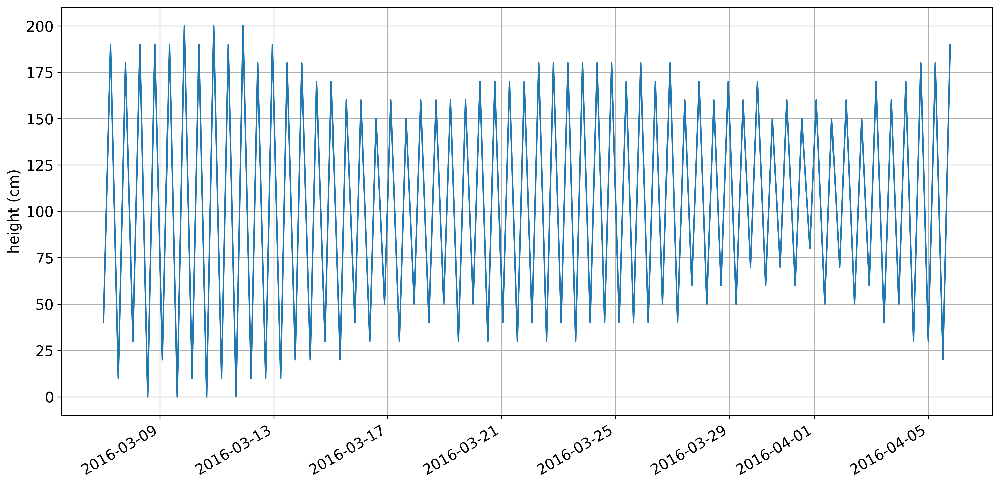

In [9]:
printmd("""
## Tidal data for Halifax
Linear interpolation
""")
dflat["height"].plot()
plt.ylabel("height (cm)")
plt.xlabel(None)
plt.grid()

In [10]:
dflat.loc[:-1,"duration"] = dflat.index[1:] - dflat.index[:-1]

In [11]:
dflat["time_start"] = dflat.index
dflat["height_start"] = dflat.height
dflat["height_change"] = -dflat.height.diff(-1)

In [12]:
#new_times = pd.date_range("2016-03-07 00:18", "2016-04-05 18:23", freq="300s")
new_times = df_detections_merged.datetime

In [13]:
new_index = dflat.index.union(new_times).drop_duplicates().astype(dflat.index.dtype)
dfi = dflat.reindex(new_index)

In [14]:
import numpy as np
for col in ['low','duration','time_start', 'height_start', 'height_change']:
    dfi[col].interpolate("pad", inplace=True)
dfi["t"] = (dfi.index - dfi.time_start) / dfi.duration

In [15]:
dfi["t2"] = dfi["t"] + (dfi["low"] == "h")
dfi.height = dfi.height_start + (dfi.height_change * 0.5*(1-np.cos(dfi.t*np.pi)))
#dfi

In [16]:
#len(dfi), len(-dfi.height.diff(-1)[:-1] / ((dfi.index[1:] - dfi.index[:-1]) / pd.Timedelta("1h")))
#dfi["dheight_cm_per_hr"] = dheight_cm_per_hr

In [17]:
dfi["dheight_cm_per_hr"] = -dfi.height.diff(-1)[:-1] / ((dfi.index[1:] - dfi.index[:-1]) / pd.Timedelta("1h"))
#dfi

In [18]:
fname = "output_tidal_times_for_Halifax_2016_5min.csv"
dfi.to_csv(fname)
printmd("Wrote data to `{}`".format(fname))

Wrote data to `output_tidal_times_for_Halifax_2016_5min.csv`

In [19]:
#dfi

Display data until 2016-04-05 18:23:00

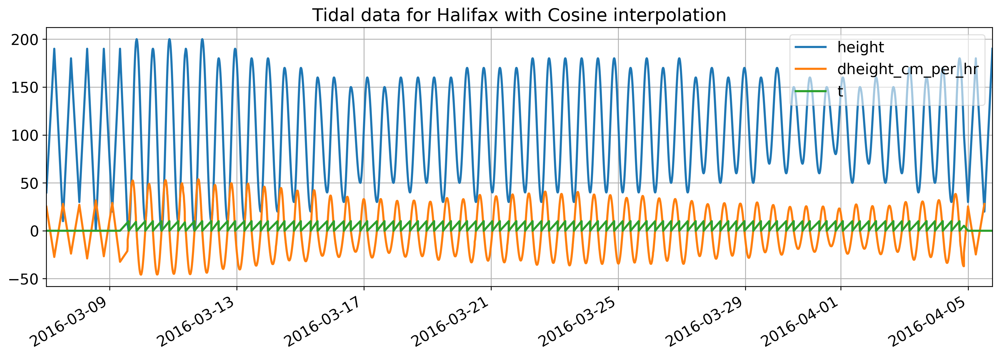

In [20]:
#end_datetime = "2016-03-15 01:18"
with plt.rc_context({'figure.figsize': (16, 5), 'lines.linewidth': 2}):
    end_datetime = dfi.index.max()
    printmd("Display data until {}".format(end_datetime))
    dfi.loc[:end_datetime].height.plot()
    dfi.loc[:end_datetime].dheight_cm_per_hr.plot()
    (dfi.loc[:end_datetime].t*10).plot()
    plt.title("Tidal data for Halifax with Cosine interpolation")
    plt.legend(loc=1)
    plt.grid()

The variable $t$ above indicate tidal phase within each of high-to-low and low-to-high portion. Its range is in $[0,1]$, but has been magnified by a factor of $10$ in the plot to show more clearly in comparison to the other variables.

Below, a new variable $t2$ is introduced that ranges from $0$ to $2$, from high tide to the next high tide, with $1$ corresponding to low tide.

In [21]:
dfmm = df_detections_merged.merge(dfi[["t2","height","dheight_cm_per_hr"]], left_on="datetime", right_index=True)

In [22]:
dj = dfmm.set_index("datetime").sort_index()
del dj["Date"], dj["Time"], dj["Date and Time"]

# Detection data is grouped by distinct "Receiver", "Transmitter" pairs
Later, each of these groups is analysed separately.
A name is produced for each pairing that reflects their configuration, such as power level, tag family, distance - as determined by parsing the metadata.

In [23]:
djg = dj.groupby(["Receiver","Transmitter"])
groups = [djg.get_group(x) for x in djg.groups]
# list(map(len, groups))

# groups is a list of DataFrames that have the respective detections.

# Receiver / Transmitter metadata

In [24]:
from geopy.distance import geodesic
def dist_m(latlon0, latlon1):
    return geodesic(latlon0, latlon1).m

In [25]:
dfmeta = pd.read_csv(file_path("range_test_raw.csv"))

File `range_test_raw.csv` does not have further metainfo merged in. This will be fixed with additional code, below.

In [26]:
dfmeta.head()

,Date and Time (UTC),Receiver,Transmitter,Transmitter Name,Transmitter Serial,Sensor Value,Sensor Unit,Station Name,Latitude,Longitude
0,2016-03-09 13:25:33,VR4-UWM-250473,A69-1601-31341,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-03-09 13:25:33,VR2W-100928,A69-1601-31341,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-03-09 13:25:35,VR2W-128559,A69-1601-31341,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-03-09 13:25:41,VR2W-100928,A69-1601-31341,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-03-09 13:25:43,VR2W-128559,A69-1601-31341,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Ingest metadata, data dictionary, and deployment info

* Load data sheets
* Correct column names, convert integers, convert datetimes
* Merge Recv/Tag info with meta data, calculate geodesic distances


In [27]:
metadata_file = file_path("metadata-from-initial-range-test.xls")
sheet_skips = {'Data Dictionary':4, 'Deployment':0}
dfmeta_data = dict((sname, pd.read_excel(metadata_file, sheet_name=sname, skiprows=skipr))
                   for sname, skipr in sheet_skips.items())

In [28]:
dfmeta_datadict = dfmeta_data['Data Dictionary'].set_index('Field Name')
dfmeta_deploy = dfmeta_data['Deployment']

In [29]:
# address possibly inconsistent use of _NUMBER vs _NO, by renaming all to _NO
dfmeta_datadict = dfmeta_datadict.set_index(dfmeta_datadict.index.str.replace('NUMBER','NO'))
dfmeta_deploy.columns = dfmeta_deploy.columns.str.replace('NUMBER','NO')
units_col = next(filter(lambda c: 'units' in c.lower(), dfmeta_datadict.columns))

In [30]:
# remove (format) part from column names in deployment table
col_names_split = dfmeta_deploy.columns.str.split(n=1)
dfmeta_deploy.columns = col_names_split.str[0]
col_formats = col_names_split.str[1]

In [31]:
# add Format column to data dictionary
dfmeta_datadict['Format'] = pd.DataFrame(col_names_split.str).transpose().set_index(0)
paren_regex = r'\((.*)\)'
dfmeta_datadict['Format'] = dfmeta_datadict['Format'].str.extract(paren_regex)

In [32]:
# remove NaN rows that do not have OTN_ARRAY specified
dfmeta_deploy.dropna(subset=['OTN_ARRAY'], inplace=True)

In [33]:
# determine columns that have format: integer ... in data dictionary
integer_cols = (dfmeta_datadict.index[dfmeta_datadict[units_col].str.match(r".*format: (integer.*)")].tolist()
                + ['INS_SERIAL_NO', 'AR_SERIAL_NO'])
dfmeta_datadict.loc[integer_cols,'Format'] = 'integer'

In [34]:
# perform type conversion of integer columns, use special int to fill NaNs
NANINT = 0
dfmeta_deploy[integer_cols] = dfmeta_deploy[integer_cols].replace({np.nan:NANINT}).astype(int)

In [35]:
def convert_otn_datetime_format_str(format_str, split_char = "T"):
    def replace_all(s, repdict):
        for a, b in repdict.items():
            s = s.replace(a, b)
        return s
    date_replacements = {"yyyy":"%Y", "mm":"%m", "dd":"%d"}
    time_replacements = {"hh":"%H", "mm":"%M", "ss":"%S"}
    date_part, time_part = format_str.split("T")
    date_part = replace_all(date_part, date_replacements)
    time_part = replace_all(time_part, time_replacements)
    return date_part + split_char + time_part

In [36]:
for col in dfmeta_datadict.index[dfmeta_datadict.index.str.match('.*DATE_TIME.*')]:
    format_str = convert_otn_datetime_format_str(dfmeta_datadict.loc[col, 'Format'])
    dfmeta_deploy[col.replace("DATE_TIME", "DATETIME")] = pd.to_datetime(dfmeta_deploy[col],
                                                                         format=format_str)

In [37]:
with pd.option_context('display.max_rows', 30,
                       'display.max_columns', 100,
                       'display.max_colwidth', -1):
    display(Markdown("### Data dictionary"))
    display(dfmeta_datadict)
    display(Markdown("### Deployment info"))
    display(dfmeta_deploy)

### Data dictionary

,Units/format example,Definition,Format
Field Name,,,
OTN_ARRAY,as in: HFX; format: 3 letters,This field is mandatory and is a unique 3-digit acronym assigned by OTN HQ. Leave blank for projects new to OTN (a unique acronym will be assigned when data are uploaded to the OTN database) or if you are uncertain of the acronym that has been assigned to your array.,NaN
STATION_NO,as in: 001; format: integer or name you gave station.,"Sequential position of the mooring assembly on the array, generally from inshore to offshore or from North to South. If your array consists of more than one subarray, use an acronym to qualify the station name. For example, for two subarrays located in East Bay and West Bay, use EB001 and WB001.",integer
DEPLOY_DATE_TIME,as in: 2009-02-26T14:05:00; format: yyyy-mm-ddThh:mm:ss,"Date and time that the equipment was deployed, in 24-hour UTC. Corresponds to the time of the captured waypoint.",yyyy-mm-ddThh:mm:ss
DEPLOY_LAT,as in: 44.47815; format: dd.ddddd; places: to 5 decimals,"Latitude of the actual deployment location, in decimal degrees. Note: in the southern hemisphere all latitudes must be negative.",NaN
DEPLOY_LONG,as in: -063.53337; format: ddd.ddddd; places: to 5 decimals,"Longitude of the actual deployment location, in decimal degrees. Note: in the western hemisphere all longitudes must be negative.",NaN
BOTTOM_DEPTH,as in: 75; format: integer,"Depth at deployment location as recorded by the vessel's depth sounder, in meters.",integer
RISER_LENGTH,as in: 50; format: integer,"Length from the anchor to the topmost float or structure of the mooring assembly, in meters.",integer
INSTRUMENT_DEPTH,as in: 20; format: integer,"Depth of the instrument, in meters.",integer
INS_MODEL_NO,"as in: VR2W (for receiver), as in: Microcat SBE 37-SM V2.6 (for Sea-Bird Electronics Microcat CTD), as in ADCP-RDI (for RDI Instruments ADCP), as in BPOD-Satlantic-yyyy-mm-dd (for Satlantic benthic pod); format: free text, not otherwise specified","Model number of the instrument as provided by the manufacturer, if NOT a receiver then prefix with instrument type and manufacturer's name or acronym. For a benthic pod, append with date of current configuration.",NaN


### Deployment info

,OTN_ARRAY,STATION_NO,DEPLOY_DATE_TIME,DEPLOY_LAT,DEPLOY_LONG,BOTTOM_DEPTH,RISER_LENGTH,INSTRUMENT_DEPTH,INS_MODEL_NO,INS_SERIAL_NO,AR_MODEL_NO,AR_SERIAL_NO,DEPLOYED_BY,RECOVERED,RECOVER_DATE_TIME,RECOVER_LAT,RECOVER_LONG,DATA_DOWNLOADED,DOWNLOAD_DATE_TIME,FILENAME,COMMENTS,DEPLOY_DATETIME,RECOVER_DATETIME,DOWNLOAD_DATETIME
0,MBT,1,2016-03-09T13:14:52,44.554133,-64.17682,203,20,183,VR4-UWM,250473,PORTMFE,36176,"D Bates, G Graca",y,2016-04-04T17:56:40,NaN,NaN,y,2016-04-08T13:09:53,VR4-UWM_250473_20160408_1.vrl,520.7205m from 002 & 822.416m from 003,2016-03-09 13:14:52,2016-04-04 17:56:40,2016-04-08 13:09:53
1,MBT,1,2016-03-09T13:14:52,44.554133,-64.17682,203,5,198,VR2W,128559,PORTMFE,36176,"D Bates, G Graca",y,2016-04-04T17:56:40,NaN,NaN,y,2016-04-06T14:07:03,VR2W_128559_20160406_1.vrl,NaN,2016-03-09 13:14:52,2016-04-04 17:56:40,2016-04-06 14:07:03
2,MBT,1,2016-03-09T13:14:52,44.554133,-64.17682,203,10,193,VR2W,100928,PORTMFE,36176,"D Bates, G Graca",y,2016-04-04T17:56:40,NaN,NaN,y,2016-04-06T14:18:57,VR2W_100928_20160406_1.vrl,NaN,2016-03-09 13:14:52,2016-04-04 17:56:40,2016-04-06 14:18:57
3,MBT,1,2016-03-09T13:14:52,44.554133,-64.17682,203,15,188,VMT,1188739,PORTMFE,36176,"D Bates, G Graca",y,2016-04-04T17:56:40,NaN,NaN,y,2016-04-06T16:53:06,VMT_1188739_20160406_105449.vrl,receiver was initialized and offloaded in local time (ADT),2016-03-09 13:14:52,2016-04-04 17:56:40,2016-04-06 16:53:06
4,MBT,2,2016-03-09T14:22:37,44.558760,-64.17783,190,25,165,V9,31341,PORTMFE,35880,"D Bates, G Graca",y,2016-04-04T18:06:15,NaN,NaN,n,NaN,NaN,415.4623m from 003,2016-03-09 14:22:37,2016-04-04 18:06:15,NaT
5,MBT,2,2016-03-09T14:22:37,44.558760,-64.17783,190,27,163,V13,31340,PORTMFE,35880,"D Bates, G Graca",y,2016-04-04T18:06:15,NaN,NaN,n,NaN,NaN,NaN,2016-03-09 14:22:37,2016-04-04 18:06:15,NaT
6,MBT,2,2016-03-09T14:22:37,44.558760,-64.17783,190,29,161,DST tilt,111,PORTMFE,35880,"D Bates, G Graca",y,2016-04-04T18:06:15,NaN,NaN,y,2016-04-12T14:00:00,0-15H0111.DAT,NaN,2016-03-09 14:22:37,2016-04-04 18:06:15,2016-04-12 14:00:00
7,MBT,3,2016-03-17T14:48:08,44.560260,-64.18262,180,25,155,v9,3134,PORTMFE,36189,"D Bates, G Graca, Schornagel",y,2016-04-04T18:14:59,NaN,NaN,n,NaN,NaN,NaN,2016-03-17 14:48:08,2016-04-04 18:14:59,NaT
8,MBT,3,2016-03-17T14:48:08,44.560260,-64.18262,180,27,153,v13,31339,PORTMFE,36189,"D Bates, G Graca, Schornagel",y,2016-04-04T18:14:59,NaN,NaN,n,NaN,NaN,NaN,2016-03-17 14:48:08,2016-04-04 18:14:59,NaT
9,MBT,3,2016-03-17T14:48:08,44.560260,-64.18262,180,29,151,v16,31335,PORTMFE,36189,"D Bates, G Graca, Schornagel",y,2016-04-04T18:14:59,NaN,NaN,n,NaN,NaN,NaN,2016-03-17 14:48:08,2016-04-04 18:14:59,NaT


In [38]:
deploy_lat_lon = dfmeta_deploy.groupby('STATION_NO')[['DEPLOY_LAT','DEPLOY_LONG']].nth(0)

In [39]:
#deploy_lat_lon

In [40]:
station_dists_m = pd.DataFrame(None, columns=deploy_lat_lon.index, index=deploy_lat_lon.index)
for stationA in deploy_lat_lon.index:
    station_dists_m.loc[stationA, stationA] = 0
    for stationB in deploy_lat_lon.loc[stationA+1:,:].index:
        dABm = dist_m(deploy_lat_lon.loc[stationA, :].values,
                      deploy_lat_lon.loc[stationB, :].values)
        station_dists_m.loc[stationA, stationB] = dABm
        station_dists_m.loc[stationB, stationA] = dABm
display(Markdown("""### Station distances
* geodesic
* in meters
* ignoring depth difference

Distance between stations 2 and 3 does not occur in detections, since there are no receivers at these stations.
"""))
station_dists_m

### Station distances
* geodesic
* in meters
* ignoring depth difference

Distance between stations 2 and 3 does not occur in detections, since there are no receivers at these stations.


STATION_NO,1,2,3
STATION_NO,,,
1,0,520.358,822.112
2,520.358,0,415.462
3,822.112,415.462,0


In [41]:
tag_specs_df = pd.read_excel(file_path("tag-specs-Mahone-Bay-range-test", "tag-summary-mahone-bay-range-test.xls"))
#tag_specs.columns
tag_specs = tag_specs_df[['Tag Family','ID Code','VUE Tag ID\n(Freq-Space-ID)','Power\n(L/H)']].copy(deep=False)
tag_specs.rename(columns={'VUE Tag ID\n(Freq-Space-ID)':'VUE Tag',
                          'Power\n(L/H)':'Power'}, inplace=True)
tag_specs.set_index("VUE Tag", inplace=True)
tag_specs

,Tag Family,ID Code,Power
VUE Tag,,,
A69-1601-31335,V16-5x,31335,H
A69-1601-31336,V16-5x,31336,H
A69-1601-31341,V9-2x,31341,L
A69-1601-31342,V9-2x,31342,L
A69-1601-31339,V13-1x,31339,H
A69-1601-31340,V13-1x,31340,H


In [42]:
display(Markdown("""### Merge tag ID Code with INS_SERIAL_NO to get metadata
The tags that have missing info here, turn out to be unimportant later, due to insufficient detection count.
"""))
tag_specs.merge(dfmeta_deploy, 'left', left_on='ID Code', right_on='INS_SERIAL_NO').transpose()

### Merge tag ID Code with INS_SERIAL_NO to get metadata
The tags that have missing info here, turn out to be unimportant later, due to insufficient detection count.


,0,1,2,3,4,5
Tag Family,V16-5x,V16-5x,V9-2x,V9-2x,V13-1x,V13-1x
ID Code,31335,31336,31341,31342,31339,31340
Power,H,H,L,L,H,H
OTN_ARRAY,MBT,NaN,MBT,NaN,MBT,MBT
STATION_NO,3,NaN,2,NaN,3,2
DEPLOY_DATE_TIME,2016-03-17T14:48:08,NaN,2016-03-09T14:22:37,NaN,2016-03-17T14:48:08,2016-03-09T14:22:37
DEPLOY_LAT,44.5603,NaN,44.5588,NaN,44.5603,44.5588
DEPLOY_LONG,-64.1826,NaN,-64.1778,NaN,-64.1826,-64.1778
BOTTOM_DEPTH,180,NaN,190,NaN,180,190
RISER_LENGTH,29,NaN,25,NaN,27,27


In [43]:
def get_device_id(device_str):
    "Return last part of '-'-separated string as int. Works on str and DataFrames of strings."
    try:
        return device_str.str.split("-").str[-1].astype(int)
    except:
        return int(device_str.split("-")[-1])

def rt_info(grdf):
    # get receiver and transmitter IDs of first detection and merge metadata
    rt_inf = pd.DataFrame(get_device_id(grdf.iloc[0,:][['Receiver','Transmitter']])).transpose()
    rt_inf = rt_inf.merge(dfmeta_deploy.add_prefix('RECV_'), 'left', left_on='Receiver', right_on='RECV_INS_SERIAL_NO')
    rt_inf = rt_inf.merge(dfmeta_deploy.add_prefix('TAG_'), 'left', left_on='Transmitter', right_on='TAG_INS_SERIAL_NO')
    rt_inf = rt_inf.iloc[0]
    try:
        rt_inf['RT_DISTANCE_M'] = station_dists_m.loc[rt_inf['RECV_STATION_NO'], rt_inf['TAG_STATION_NO']]
    except:
        pass
    return rt_inf

def rt_dist(grdf):
    rt_inf = rt_info(grdf)
    try:
        return rt_inf['RT_DISTANCE_M']
    except:
        #print(rt_inf)
        return np.nan

def rt_name(grdf, dist_str=None):
    try:
        metainf = tag_specs.loc[grdf.iloc[0]["Transmitter"], ['Tag Family','Power']]
        metainf = "/" + "-".join(metainf.values)
        if dist_str:
            metainf += "-" + dist_str(rt_dist(grdf))
    except:
        metainf = ''
    rt = grdf.iloc[0][["Receiver","Transmitter"]]
    rt["Transmitter"] = "tag-%d" % get_device_id(rt["Transmitter"])
    dscr = "/".join(rt) + metainf
    return dscr

In [44]:
sec1 = pd.Timedelta("1s")
def calc_intervals(grdf):
    return -grdf.reset_index().datetime.diff(-1) / sec1
def group_info(grdf=None):
    if grdf is None:
        return "count", "min_interval", "max_interval", "Receiver/Transmitter", "dist_m"
    ivs = calc_intervals(grdf)
    return len(grdf), ivs.min(), ivs.max(), rt_name(grdf), rt_dist(grdf)

In [45]:

gsdf = pd.DataFrame((group_info(grdf) for grdf in groups),
                    columns=[*group_info()]
                   )

In [46]:
d_min, d_max = gsdf['dist_m'].max(), gsdf['dist_m'].min()
dist_th = np.mean((d_min, d_max))
def dist_str(dist):
    if np.isnan(dist):
        return "U"
    elif dist > dist_th:
        return "F"
    else:
        return "N"
gsdf['Receiver/Transmitter'] = gsdf['Receiver/Transmitter'] + "-" + gsdf['dist_m'].apply(dist_str)

In [47]:
printmd("""# Summary of detections by Receiver/Transmitter pair
**R/T name format:**  
Receiver/Transmitter/Tag Family/Power(H,L)/Distance(Near,Far)

**Distances:**  
near = %.2f m  
far = %.2f m
""" % (d_min, d_max))
gsdf.sort_values(by="Receiver/Transmitter", ascending=False)

# Summary of detections by Receiver/Transmitter pair
**R/T name format:**  
Receiver/Transmitter/Tag Family/Power(H,L)/Distance(Near,Far)

**Distances:**  
near = 822.11 m  
far = 520.36 m


,count,min_interval,max_interval,Receiver/Transmitter,dist_m
21,41,8.0,412585.0,VR4-UWM-250473/tag-31342/V9-2x-L-U,NaN
20,2449,8.0,43120.0,VR4-UWM-250473/tag-31341/V9-2x-L-N,520.35822
19,4680,8.0,14553.0,VR4-UWM-250473/tag-31340/V13-1x-H-N,520.35822
18,769,8.0,439208.0,VR4-UWM-250473/tag-31339/V13-1x-H-F,822.11224
17,3992,8.0,7320.0,VR4-UWM-250473/tag-31335/V16-5x-H-F,822.11224
16,5,1138.0,1369251.0,VR2W-128559/tag-31342/V9-2x-L-U,NaN
15,4061,8.0,43082.0,VR2W-128559/tag-31341/V9-2x-L-N,520.35822
14,7056,8.0,9438.0,VR2W-128559/tag-31340/V13-1x-H-N,520.35822
13,755,8.0,521763.0,VR2W-128559/tag-31339/V13-1x-H-F,822.11224
12,5075,8.0,9684.0,VR2W-128559/tag-31335/V16-5x-H-F,822.11224


# Plots of detection density and interval lengths <br/> against tidal phase (t2) and water velocity

In [48]:
def make_detection_rate(tdfok, exp_interval_s=300, num_time_bins=200):
    """calculate detection rate"""
    # shift time stamps to start at 0 for first measurement iloc[0]
    time_stamps = (tdfok.datetime - tdfok.datetime.iloc[0]) / sec1
    dtcnt, bins_dt = np.histogram(time_stamps, bins=num_time_bins)
    expcount = np.ceil((bins_dt[1]-bins_dt[0]) / exp_interval_s) # expected count per bin if no ping is lost
    bins_rt = bins_dt[:-1] * sec1 + np.datetime64(tdfok.datetime.iloc[0]) # shift bin timestamps back to actual time
    det_rate = pd.Series(data=dtcnt/expcount,  # detected count normalized by expected count (may be > 1)
                         index=bins_rt,
                         name="detection_rate")
    tdfok = pd.concat([tdfok.set_index("datetime"), det_rate], axis=1).interpolate(type="pad")
    tdfok.index.name = "datetime"
    return tdfok.reset_index()

Skipping receiver/transmitter combinations due to insufficient detections:

VMT-1188739/tag-31339/V13-1x-H-F

VMT-1188739/tag-31341/V9-2x-L-N

VR2W-100928/tag-11228

VR2W-100928/tag-14945

VR2W-100928/tag-31342/V9-2x-L-U

VR2W-128559/tag-14945

VR2W-128559/tag-31342/V9-2x-L-U

VR4-UWM-250473/tag-31342/V9-2x-L-U

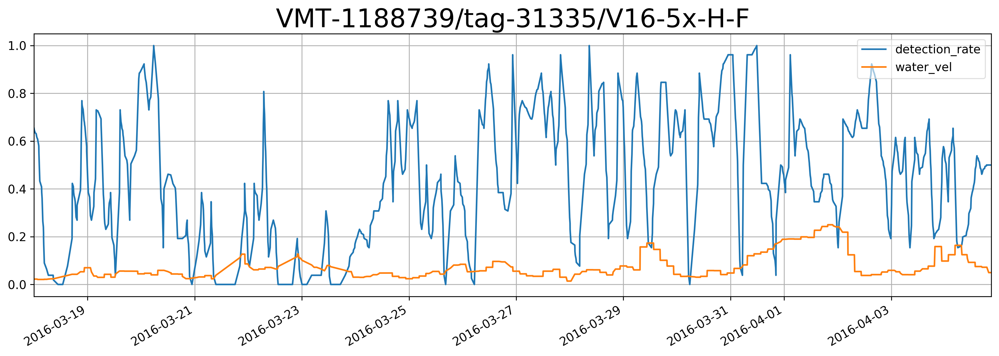

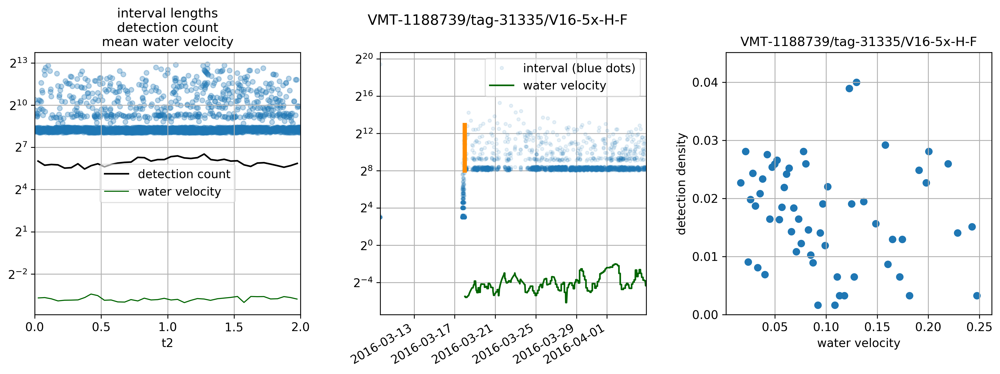

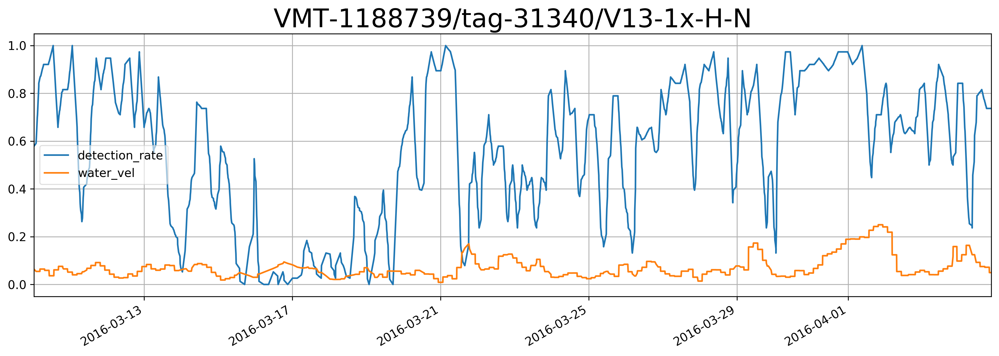

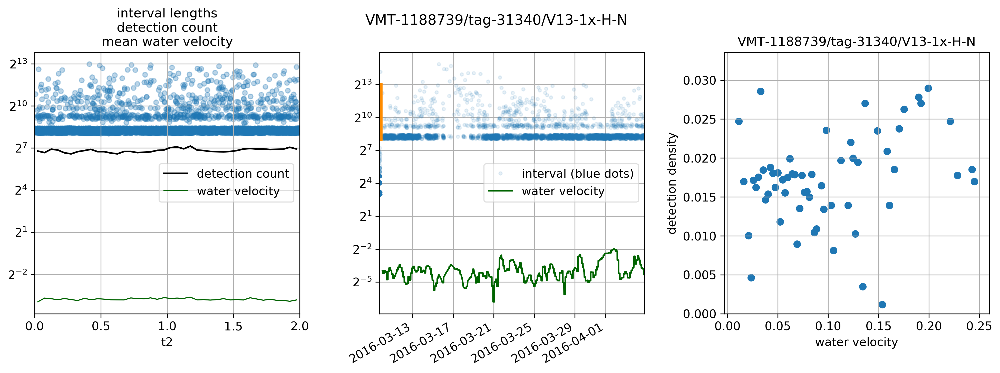

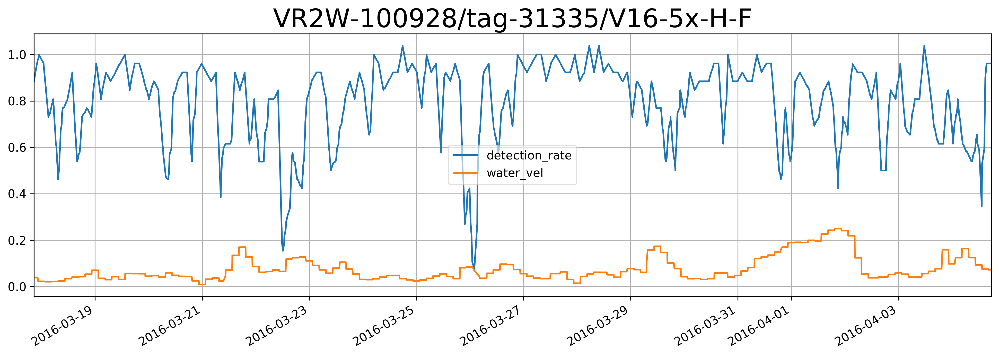

...

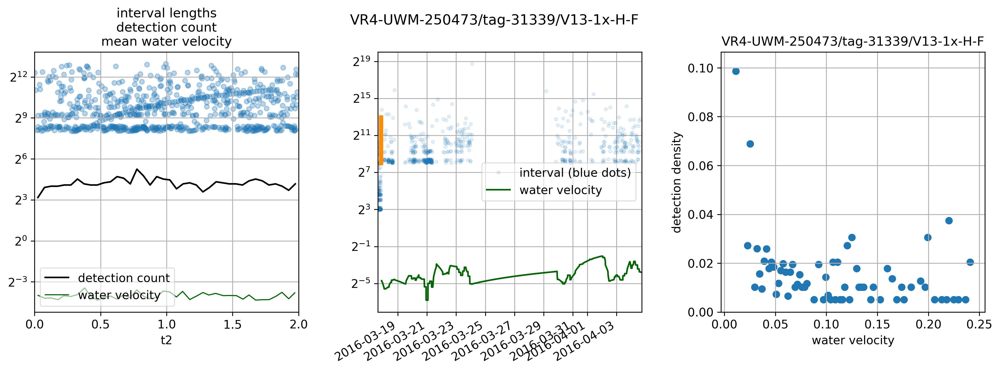

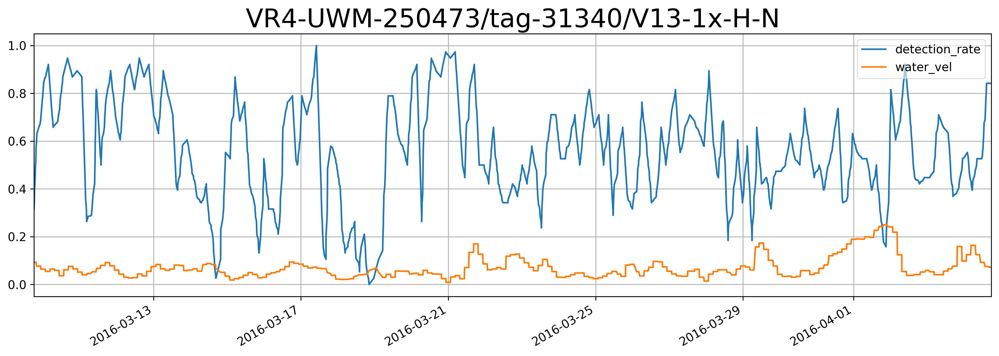

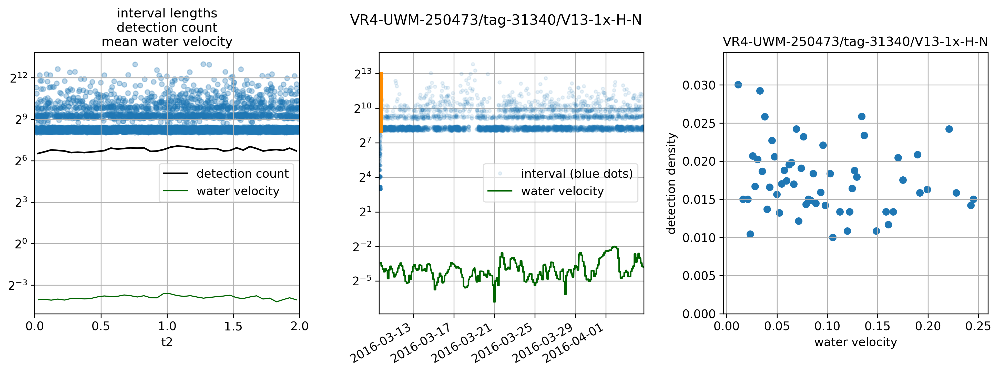

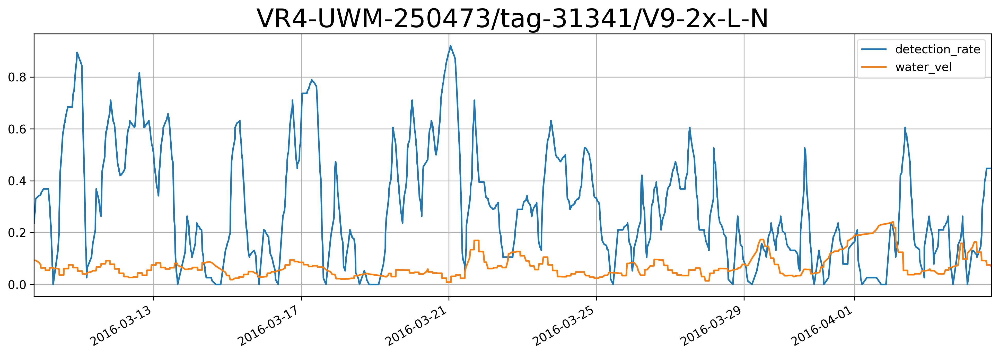

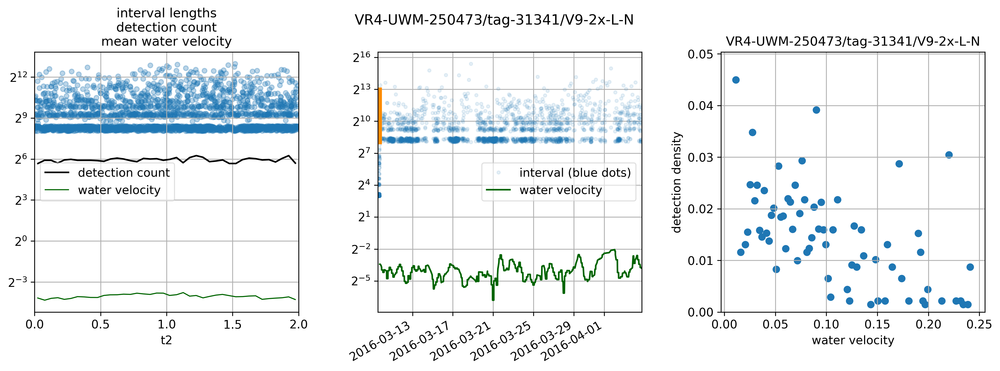

In [49]:
rcParams['figure.figsize'] = 16, 5
rcParams['font.size'] = 11
rcParams['figure.max_open_warning'] = 50

t2bin_stepsize = 0.05
t2bins = np.arange(0, 2+1e-4, t2bin_stepsize)
interval_all = np.zeros(len(t2bins)-1)
mean_ping_interval = 300 # sec
num_time_bins = 200
MIN_DETECTIONS = 100 # skip receiver/transmitter combinations that have less than this number of detections
rt_name_dist = lambda gr: rt_name(gr, dist_str)

skipmsg = False
# each group contains all detections for a particular receiver/transmitter combination
for gr in groups:
    if len(gr) < MIN_DETECTIONS:
        if not skipmsg:
            printmd("Skipping receiver/transmitter combinations due to insufficient detections:")
            skipmsg = True
        printmd("{}".format(rt_name_dist(gr)))
        continue
        
    # add interval length and water velocity calculations to dataframe
    tdf = gr.copy(deep=False).reset_index()
    tdf["interval"] = calc_intervals(tdf.set_index("datetime"))
    tdf["water_vel"] = (tdf.water_u**2+tdf.water_v**2).apply(np.sqrt)
    #tdf["water_vel"] = (tdf.water_u_bottom**2+tdf.water_v_bottom**2).apply(np.sqrt)
    #tdf["water_vel"] = tdf["dheight_cm_per_hr"]
    #colnames = ['salinity_bottom', 'water_temp_bottom', 'water_u_bottom', 'water_v_bottom',
    #            'salinity', 'water_temp', 'water_u', 'water_v']
    #tdf["water_vel"] = tdf["salinity"]

    # ignore date range with short signal intervals at beginning
    cutoff_t = tdf.loc[tdf[tdf.interval < 2**8].index.max()+1,
                       "datetime"]
    tdfok = tdf[tdf.datetime>cutoff_t].dropna()
    tdfok = tdfok.loc[tdfok["interval"] < 2**13]
    tdfok = make_detection_rate(tdfok, exp_interval_s=mean_ping_interval, num_time_bins=num_time_bins)
    # TODO add tdfok to list for later pd.concat
    
    if True:
        tdfok.set_index("datetime")[["detection_rate","water_vel"]].plot(grid=True)
        plt.title(rt_name_dist(gr), fontsize=24)
        plt.xlabel(None)

    base_interval = tdfok.interval[tdfok.interval<2**9].mean() # should be 5 min = 300 sec
    tdfmean = tdfok.groupby(pd.cut(tdfok["t2"], t2bins)).mean()
    tdfcount = tdfok.groupby(pd.cut(tdfok["t2"], t2bins)).count()
    tdfcount["bins"] = tdfcount.index.map(lambda i: (i.left+i.right)/2)
    interval_all += tdfcount["t2"]

    fig, axs = plt.subplots(nrows=1, ncols=3)
    fig.suptitle(rt_name_dist(gr))
    
    # plot over tidal phase t2: interval lengths, detection density, mean water_velocity
    ax = tdfok.plot.scatter("t2", "interval", alpha=0.3, ax=axs[0])
    ax.set_yscale("log", basey=2)
    ax.set_ylabel(None)
    ax.set_xlabel("tidal phase")
    ax.set_title("interval lengths\ndetection count\nmean water velocity", fontsize=12)

    #tfivs = (tdfok.datetime.max()-tdfok.datetime.min())/sec1/(len(tdfok)/len(t2bins))/tdfcount["t2"].values
    tfivs = tdfcount["t2"].values
    axs[0].plot(tdfcount["bins"].tolist(), tfivs, c="black")
    #ax = tdfmean.plot("t2", "water_vel", alpha=1, ax=axs[0], c="darkgreen", linewidth=1)
    ax = tdfmean.plot("t2", "water_vel", alpha=1, ax=axs[0], c="darkgreen", linewidth=1)
    ax.legend(["detection count", "water velocity"],
              loc=0)
    ax.grid()
    ax.set_xlim(xmin=0, xmax=2)

    # interval lengths over date range
    if True:
        ax = tdf.set_index("datetime")["interval"].plot(style=".", ax=axs[1], alpha=.1)
        tdfok.set_index("datetime").water_vel.plot(ax=axs[1], c="darkgreen")
        axs[1].plot([cutoff_t]*2, [tdfok.interval.min(), tdfok.interval.max()], c="darkorange", linewidth=4)
        ax.set_yscale("log", basey=2)
        ax.grid()
        ax.legend(['interval (blue dots)', 'water velocity'])
        ax.xaxis.label.set_visible(False)
    #ax = tdfmean.plot("t2","interval", alpha=1, ax=ax1, c="darkgrey", linewidth=2)
    elif False:
        ax = tdf.set_index("datetime")["interval"].plot(style=".", ax=axs[1], alpha=.1)
        tdfok.set_index("datetime")[["water_vel", "detection_rate"]].plot(ax=ax)
        ax.set_yscale("log", basey=2)
        ax.grid()
        ax.legend(['interval (blue dots)', 'water velocity', 'detection_rate'])
    else:
        #tdfok.set_index("datetime")[["water_vel", "detection_rate"]].plot(ax=axs[1], grid=True)
        # plot detection_rate and water_velocity in two vertically stacked plots
        mainax = axs[1]
        l,b,w,h = mainax.get_position().bounds
        axs[1].axis("off")
        ax1 = plt.axes([l, b, w, h*.45])
        ax2 = plt.axes([l, b + h/2, w, h*.45])
        ax = tdfok.set_index("datetime")["water_vel"].plot(ax=ax1, color="darkorange", grid=True)
        ax.xaxis.label.set_visible(False)
        ax.legend(loc=2)
        ax.set_ylim(ymin=0)
        ax = tdfok.set_index("datetime")["detection_rate"].plot(ax=ax2, color="gray", grid=True)
        plt.tick_params("x", labelbottom=False, bottom="off")
        ax.xaxis.label.set_visible(False)
        ax.legend(loc=2)
        ax.set_ylim(ymin=0)

    # detection density per water_vel density
    #division = np.arange(0, 0.25001, 0.25/100)
    v_min = tdfok["water_vel"].min()
    v_max = tdfok["water_vel"].max()
    division = np.arange(v_min, v_max+1e-5, (v_max-v_min)/100)
    counts, _ = np.histogram(tdfok["water_vel"], bins=division)
    vel_grid = pd.date_range(tdfok["datetime"].min(), tdfok.datetime.max(), freq="1h")
    count_denom, _ = np.histogram(tdfok.set_index("datetime").reindex(vel_grid, method="nearest")["water_vel"], bins=division)
    nzi = count_denom != 0
    counts_norm = counts
    counts_norm[nzi] = counts[nzi] / (count_denom[nzi] / sum(count_denom))
    counts_norm = counts_norm / sum(counts_norm)
    # print(counts)
    #tdfok["water_vel"].hist(bins=division)
    #plt.bar(x=division[1:], height=counts, width=0.25/100)    #text=ax.text(0,0, "", va="bottom", ha="left")
    axs[2].scatter(x=division[1:][nzi], y=counts_norm[nzi])    #text=ax.text(0,0, "", va="bottom", ha="left")
    plt.ylim(ymin=0)
    axs[2].grid()
    axs[2].set_xlabel("water velocity")
    axs[2].set_ylabel("detection density")
    axs[2].set_title(rt_name_dist(gr), fontsize=12)
    plt.subplots_adjust(wspace=.3)


# Discussion

In the above visual summary, the **H-N** combinations, i.e. high-power, near distance, are the ones where water velocity shows the least effect on variations in detection rate (detection density). This confirms expectations and shows promise for the proposed study method. Next steps include:

- Continue to work with detection rate (DR) as calculated in a fixed grid of time windows
- Compare variations of DR with respect to other environmental variables
- Import other environmental variables automatically via data source APIs (ERDDAP, kadlu.fetch)
- Determine suitable numerical measure of factor importance in addition to visual analysis 


# Acknowledgements

The above analysis was performed using [data from OTN](http://members.devel.oceantrack.org/erddap/tabledap/otnunit_aat_detections.html) (provided by Jonathan Pye of OTN), in combination with HYCOM environmental data and tidal data provided by Casey Hilliard (Meridian/Dal), with a synthesized dataset prepared by Matthew Berkowitz (SFU), with project definition and guidance provided by Oliver Kirsebom (Dal) and Ines Hessler (Dal) as part of the [Meridian Network](https://meridian.cs.dal.ca).